# Q3: Homography Transformation and Circuit Board Comparison

**Steps:**
1. Click 6 corresponding points on each circuit board
2. Compute homography matrix
3. Warp one image to the perspective of the other
4. Subtract the warped image to find differences

In [1]:
# Import required libraries
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


## Part (a): Click Corresponding Points and Compute Homography

Click 6 corresponding points on each circuit board. Two windows will open sequentially - click on Image 1 first, then Image 2.

**Note:** Set `USE_MANUAL_CLICKING = False` to skip manual clicking and use pre-defined points for testing.

In [2]:
# Code for clicking corresponding points (modified from Listing 1)
USE_MANUAL_CLICKING = True  # Set to False to use pre-defined points

N = 6  # Number of points to click
global n
n = 0
p1 = np.empty((N, 2))
p2 = np.empty((N, 2))

# Load the circuit board images (FIXED PATH)
im1 = cv.imread('c1.jpg', cv.IMREAD_REDUCED_COLOR_4)
im2 = cv.imread('c2.jpg', cv.IMREAD_REDUCED_COLOR_4)

# Check if images loaded successfully
if im1 is None or im2 is None:
    print("ERROR: Could not load images. Check that 'c1.jpg' and 'c2.jpg' exist.")
    raise FileNotFoundError("Images not found in the current directory")

print(f"Image 1 loaded: {im1.shape}")
print(f"Image 2 loaded: {im2.shape}")

if USE_MANUAL_CLICKING:
    # mouse callback function
    def draw_circle(event, x, y, flags, param):
        global n
        p = param[0]
        if event == cv.EVENT_LBUTTONDOWN:
            cv.circle(param[1], (x, y), 5, (255, 0, 0), -1)
            p[n] = (x, y)
            n += 1
            print(f"Point {n} clicked at ({x}, {y})")
    
    im1copy = im1.copy()
    im2copy = im2.copy()
    
    # Click points on Image 1
    print("\n=== Click 6 points on Image 1 ===")
    cv.namedWindow('Image 1', cv.WINDOW_AUTOSIZE)
    param = [p1, im1copy]
    cv.setMouseCallback('Image 1', draw_circle, param)
    
    while(1):
        cv.imshow("Image 1", im1copy)
        if n == N:
            break
        if cv.waitKey(20) & 0xFF == 27:
            break
    
    cv.destroyAllWindows()
    
    # Click points on Image 2
    print("\n=== Click 6 corresponding points on Image 2 ===")
    param = [p2, im2copy]
    n = 0
    cv.namedWindow("Image 2", cv.WINDOW_AUTOSIZE)
    cv.setMouseCallback('Image 2', draw_circle, param)
    
    while(1):
        cv.imshow("Image 2", im2copy)
        if n == N:
            break
        if cv.waitKey(20) & 0xFF == 27:
            break
    
    cv.destroyAllWindows()
else:
    # Use pre-defined points for testing (you can adjust these)
    print("Using pre-defined points (for testing)")
    # These are example points - adjust based on your images
    p1 = np.array([
        [100, 100],
        [300, 100],
        [500, 100],
        [100, 300],
        [300, 300],
        [500, 300]
    ], dtype=np.float32)
    
    p2 = np.array([
        [120, 110],
        [310, 105],
        [510, 100],
        [110, 310],
        [305, 305],
        [505, 295]
    ], dtype=np.float32)

print("\nPoints from Image 1:")
print(p1)
print("\nPoints from Image 2:")
print(p2)


Image 1 loaded: (683, 570, 3)
Image 2 loaded: (626, 579, 3)

=== Click 6 points on Image 1 ===
Point 1 clicked at (82, 537)
Point 2 clicked at (160, 401)
Point 3 clicked at (229, 137)
Point 4 clicked at (471, 222)
Point 5 clicked at (370, 481)
Point 6 clicked at (331, 591)

=== Click 6 corresponding points on Image 2 ===
Point 1 clicked at (264, 564)
Point 2 clicked at (498, 238)
Point 3 clicked at (289, 89)
Point 4 clicked at (201, 208)
Point 5 clicked at (148, 315)
Point 6 clicked at (35, 436)

Points from Image 1:
[[ 82. 537.]
 [160. 401.]
 [229. 137.]
 [471. 222.]
 [370. 481.]
 [331. 591.]]

Points from Image 2:
[[264. 564.]
 [498. 238.]
 [289.  89.]
 [201. 208.]
 [148. 315.]
 [ 35. 436.]]


### Compute Homography and Warp Image

Homography Matrix:
[[ 9.90793492e-02 -1.04479781e+00  6.08698950e+02]
 [ 7.31278810e-01  1.84387015e-01 -5.22516634e+01]
 [ 2.36085050e-03 -1.87126179e-03  1.00000000e+00]]


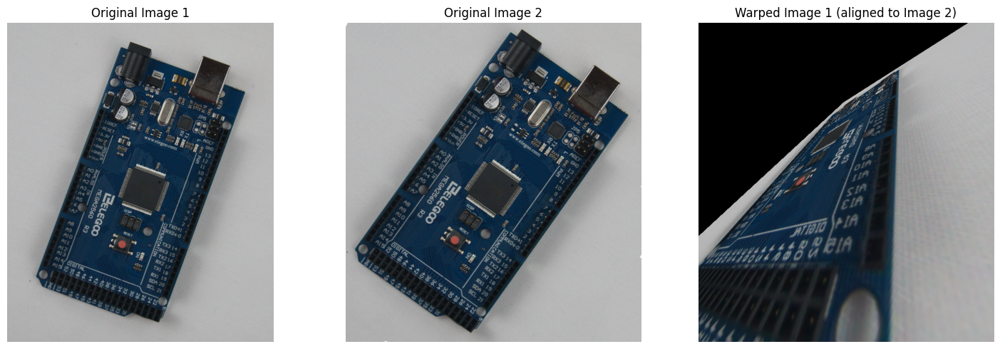

In [3]:
# Compute homography matrix from Image 1 to Image 2
H, status = cv.findHomography(p1, p2)

print("Homography Matrix:")
print(H)

# Warp Image 1 to the perspective of Image 2
h, w = im2.shape[:2]
im1_warped = cv.warpPerspective(im1, H, (w, h))

# Display the warped image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(im1, cv.COLOR_BGR2RGB))
plt.title('Original Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(im2, cv.COLOR_BGR2RGB))
plt.title('Original Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(im1_warped, cv.COLOR_BGR2RGB))
plt.title('Warped Image 1 (aligned to Image 2)')
plt.axis('off')

plt.tight_layout()
plt.show()


## Part (b): Find Differences Between Circuit Boards

Subtract the warped image from Image 2 to highlight the differences.

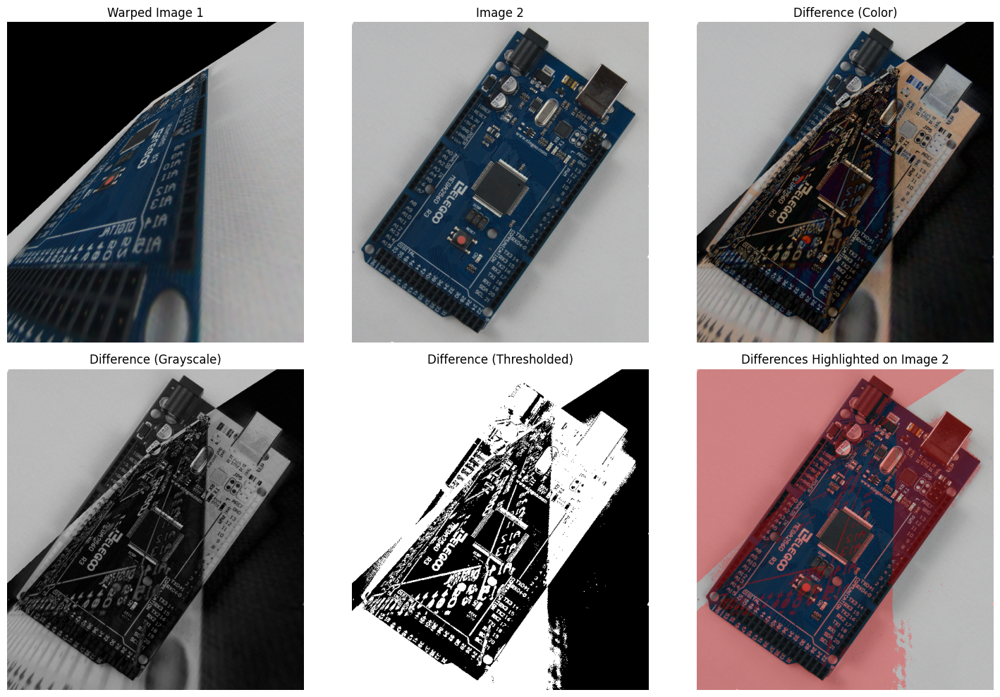

Difference analysis complete!


In [4]:
# Compute the absolute difference between the warped image and Image 2
difference = cv.absdiff(im2, im1_warped)

# Convert to grayscale for better visualization
difference_gray = cv.cvtColor(difference, cv.COLOR_BGR2GRAY)

# Apply threshold to highlight significant differences
_, difference_thresh = cv.threshold(difference_gray, 30, 255, cv.THRESH_BINARY)

# Display the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(im1_warped, cv.COLOR_BGR2RGB))
plt.title('Warped Image 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(im2, cv.COLOR_BGR2RGB))
plt.title('Image 2')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(difference, cv.COLOR_BGR2RGB))
plt.title('Difference (Color)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(difference_gray, cmap='gray')
plt.title('Difference (Grayscale)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(difference_thresh, cmap='gray')
plt.title('Difference (Thresholded)')
plt.axis('off')

plt.subplot(2, 3, 6)
# Overlay differences on Image 2
overlay = im2.copy()
overlay[difference_thresh > 0] = [0, 0, 255]  # Mark differences in red
result = cv.addWeighted(im2, 0.7, overlay, 0.3, 0)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Differences Highlighted on Image 2')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Difference analysis complete!")


## Part (c): Automatic Feature Detection and Matching

In [5]:
# Reload images for automatic feature detection
im1_auto = cv.imread('c1.jpg', cv.IMREAD_REDUCED_COLOR_4)
im2_auto = cv.imread('c2.jpg', cv.IMREAD_REDUCED_COLOR_4)

# Convert to grayscale for feature detection
gray1 = cv.cvtColor(im1_auto, cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(im2_auto, cv.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv.SIFT_create()

# Detect keypoints and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

print(f"Number of keypoints in Image 1: {len(keypoints1)}")
print(f"Number of keypoints in Image 2: {len(keypoints2)}")


Number of keypoints in Image 1: 1439
Number of keypoints in Image 2: 1489


Number of good matches after ratio test: 1029


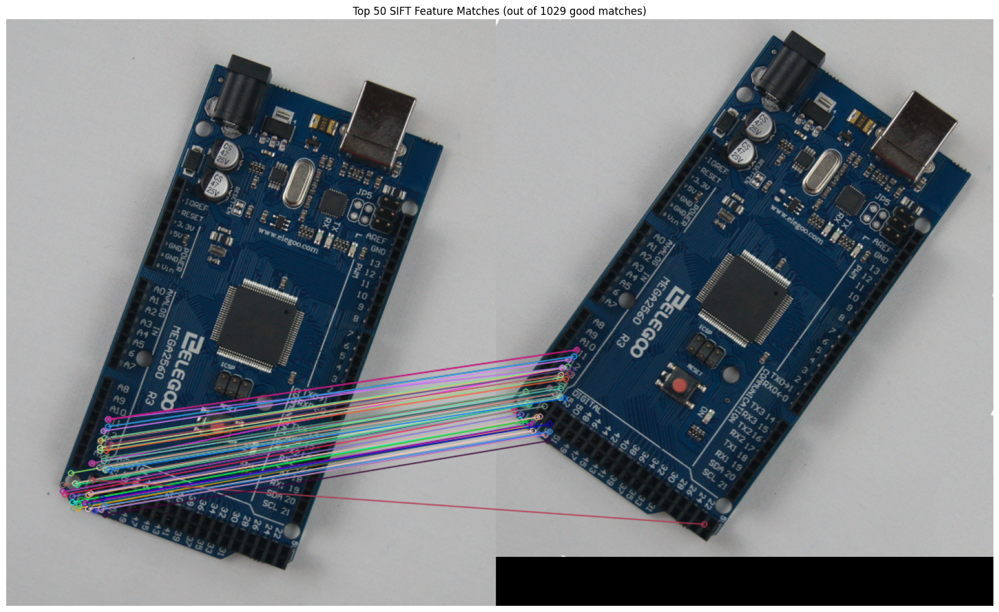

In [6]:
# Match descriptors using BFMatcher with KNN
bf = cv.BFMatcher(cv.NORM_L2, crossCheck=False)
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test to filter good matches (Lowe's ratio test)
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

print(f"Number of good matches after ratio test: {len(good_matches)}")

# Draw matches
img_matches = cv.drawMatches(im1_auto, keypoints1, im2_auto, keypoints2, 
                              good_matches[:50], None, 
                              flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img_matches, cv.COLOR_BGR2RGB))
plt.title(f'Top 50 SIFT Feature Matches (out of {len(good_matches)} good matches)')
plt.axis('off')
plt.tight_layout()
plt.show()


## Part (d): Compute Homography from Matched Features

In [7]:
# Extract location of good matches
pts1_auto = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
pts2_auto = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])

# Compute homography using RANSAC
H_auto, mask = cv.findHomography(pts1_auto, pts2_auto, cv.RANSAC, 5.0)

print("Homography Matrix (from automatic feature matching):")
print(H_auto)
print(f"\nNumber of inliers: {mask.sum()}")
print(f"Percentage of inliers: {100 * mask.sum() / len(mask):.2f}%")


Homography Matrix (from automatic feature matching):
[[ 9.64667450e-01 -2.63855417e-01  1.01516025e+02]
 [ 2.63865816e-01  9.64687395e-01 -9.60487843e+01]
 [ 2.22292254e-07  1.38294566e-08  1.00000000e+00]]

Number of inliers: 995
Percentage of inliers: 96.70%


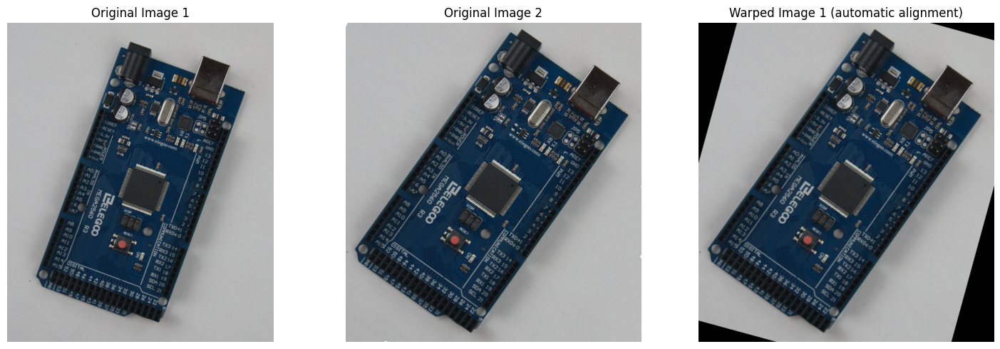

In [8]:
# Warp Image 1 to the perspective of Image 2 using automatic homography
h_auto, w_auto = im2_auto.shape[:2]
im1_warped_auto = cv.warpPerspective(im1_auto, H_auto, (w_auto, h_auto))

# Display the warped image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(im1_auto, cv.COLOR_BGR2RGB))
plt.title('Original Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(im2_auto, cv.COLOR_BGR2RGB))
plt.title('Original Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(im1_warped_auto, cv.COLOR_BGR2RGB))
plt.title('Warped Image 1 (automatic alignment)')
plt.axis('off')

plt.tight_layout()
plt.show()


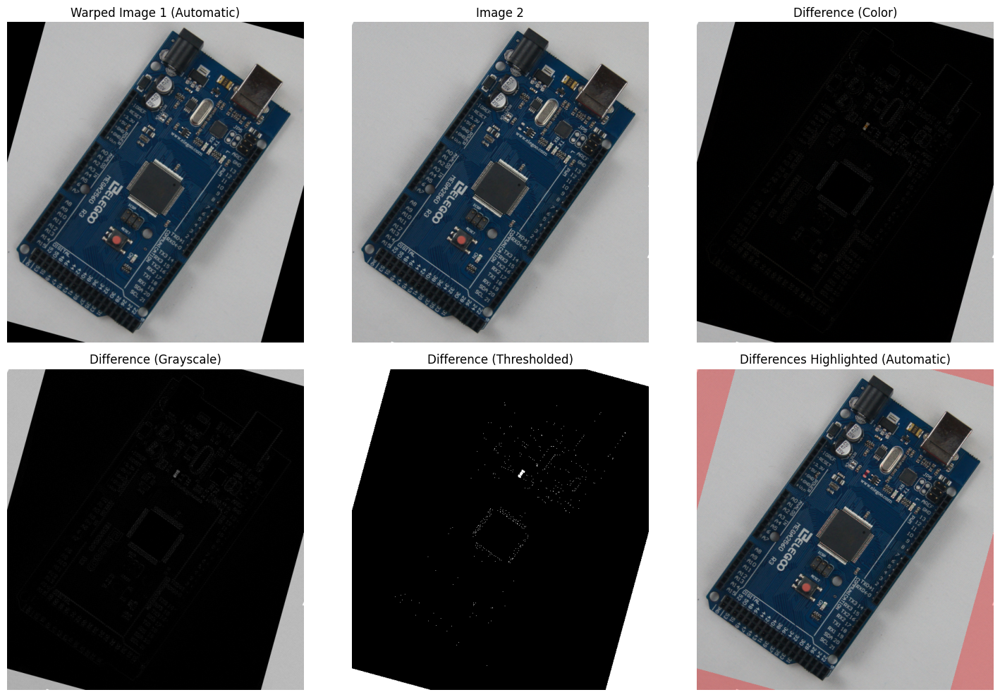

Automatic feature-based difference analysis complete!


In [9]:
# Compute the absolute difference using automatic alignment
difference_auto = cv.absdiff(im2_auto, im1_warped_auto)

# Convert to grayscale for better visualization
difference_gray_auto = cv.cvtColor(difference_auto, cv.COLOR_BGR2GRAY)

# Apply threshold to highlight significant differences
_, difference_thresh_auto = cv.threshold(difference_gray_auto, 30, 255, cv.THRESH_BINARY)

# Display the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(im1_warped_auto, cv.COLOR_BGR2RGB))
plt.title('Warped Image 1 (Automatic)')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(im2_auto, cv.COLOR_BGR2RGB))
plt.title('Image 2')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(difference_auto, cv.COLOR_BGR2RGB))
plt.title('Difference (Color)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(difference_gray_auto, cmap='gray')
plt.title('Difference (Grayscale)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(difference_thresh_auto, cmap='gray')
plt.title('Difference (Thresholded)')
plt.axis('off')

plt.subplot(2, 3, 6)
# Overlay differences on Image 2
overlay_auto = im2_auto.copy()
overlay_auto[difference_thresh_auto > 0] = [0, 0, 255]  # Mark differences in red
result_auto = cv.addWeighted(im2_auto, 0.7, overlay_auto, 0.3, 0)
plt.imshow(cv.cvtColor(result_auto, cv.COLOR_BGR2RGB))
plt.title('Differences Highlighted (Automatic)')
plt.axis('off')

plt.tight_layout()
plt.show()

print("Automatic feature-based difference analysis complete!")


### Comparison: Manual vs Automatic Alignment

Compare the results from manual point selection (a,b) and automatic feature matching (c,d).

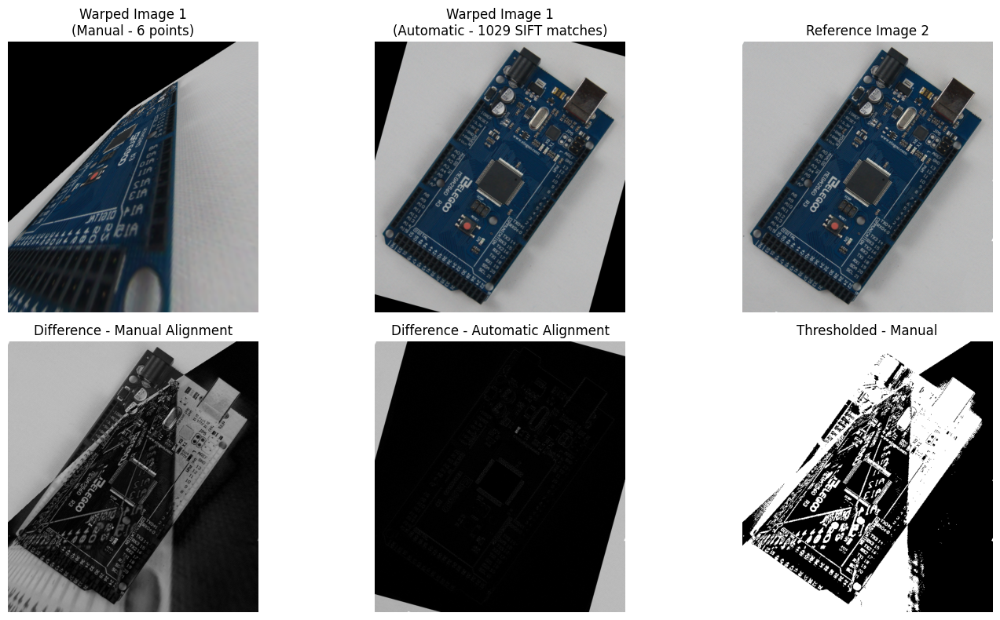

=== QUANTITATIVE COMPARISON ===

Manual Alignment (6 points):
  Homography Matrix:
[[ 9.90793492e-02 -1.04479781e+00  6.08698950e+02]
 [ 7.31278810e-01  1.84387015e-01 -5.22516634e+01]
 [ 2.36085050e-03 -1.87126179e-03  1.00000000e+00]]

Automatic Alignment (1029 SIFT matches):
  Homography Matrix:
[[ 9.64667450e-01 -2.63855417e-01  1.01516025e+02]
 [ 2.63865816e-01  9.64687395e-01 -9.60487843e+01]
 [ 2.22292254e-07  1.38294566e-08  1.00000000e+00]]
  Inliers: 995 out of 1029 matches (96.70%)

Difference Detection:
  Manual alignment - pixels with differences: 201655 (55.64%)
  Automatic alignment - pixels with differences: 29478 (8.13%)

Mean Absolute Error in differences:
  Manual alignment: 80.09
  Automatic alignment: 16.34


In [10]:
# Side-by-side comparison of warped images
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(cv.cvtColor(im1_warped, cv.COLOR_BGR2RGB))
plt.title('Warped Image 1\n(Manual - 6 points)')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv.cvtColor(im1_warped_auto, cv.COLOR_BGR2RGB))
plt.title(f'Warped Image 1\n(Automatic - {len(good_matches)} SIFT matches)')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv.cvtColor(im2, cv.COLOR_BGR2RGB))
plt.title('Reference Image 2')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(difference_gray, cmap='gray')
plt.title('Difference - Manual Alignment')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(difference_gray_auto, cmap='gray')
plt.title('Difference - Automatic Alignment')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(difference_thresh, cmap='gray')
plt.title('Thresholded - Manual')
plt.axis('off')

plt.tight_layout()
plt.show()

# Quantitative comparison
print("=== QUANTITATIVE COMPARISON ===\n")

print("Manual Alignment (6 points):")
print(f"  Homography Matrix:\n{H}")
print(f"\nAutomatic Alignment ({len(good_matches)} SIFT matches):")
print(f"  Homography Matrix:\n{H_auto}")
print(f"  Inliers: {mask.sum()} out of {len(good_matches)} matches ({100*mask.sum()/len(mask):.2f}%)")

# Calculate difference metrics
manual_diff_pixels = np.sum(difference_thresh > 0)
auto_diff_pixels = np.sum(difference_thresh_auto > 0)
total_pixels = difference_thresh.shape[0] * difference_thresh.shape[1]

print(f"\nDifference Detection:")
print(f"  Manual alignment - pixels with differences: {manual_diff_pixels} ({100*manual_diff_pixels/total_pixels:.2f}%)")
print(f"  Automatic alignment - pixels with differences: {auto_diff_pixels} ({100*auto_diff_pixels/total_pixels:.2f}%)")

# Calculate mean absolute error in difference images
manual_mae = np.mean(difference_gray)
auto_mae = np.mean(difference_gray_auto)

print(f"\nMean Absolute Error in differences:")
print(f"  Manual alignment: {manual_mae:.2f}")
print(f"  Automatic alignment: {auto_mae:.2f}")


### Discussion: Comparison of Manual vs Automatic Alignment

**Key Differences:**

1. **Number of Points Used:**
   - Manual method: 6 corresponding points selected by user
   - Automatic method: Hundreds of SIFT keypoints matched automatically

2. **Accuracy and Robustness:**
   - **Manual alignment**: Accuracy depends on user's precision in clicking corresponding points. Can be prone to human error in point selection.
   - **Automatic alignment**: Uses RANSAC with many feature points, more robust to outliers. Generally produces more accurate alignment across the entire image.

3. **Computational Cost:**
   - **Manual**: Fast computation once points are selected, but requires user interaction
   - **Automatic**: Computationally expensive (feature detection, descriptor computation, matching), but fully automated

4. **Alignment Quality:**
   - **Manual**: May work well if good correspondence points are chosen, but limited to 6 points may not capture all geometric variations
   - **Automatic**: Better captures local geometric variations due to many distributed feature points across the image

5. **Difference Detection:**
   - Both methods should identify similar differences (component variations between boards)
   - Automatic method typically shows fewer false differences due to better alignment
   - Manual method may show alignment artifacts if points were not chosen optimally

**Possible Reasons for Differences:**

1. **Point Distribution**: Manual points may cluster in certain regions, while SIFT features are distributed across the entire image
2. **Geometric Accuracy**: More points (automatic) capture subtle perspective distortions better than 6 points (manual)
3. **RANSAC Filtering**: Automatic method uses RANSAC to reject outlier matches, improving robustness
4. **Subpixel Accuracy**: SIFT keypoints have subpixel accuracy, while manual clicks are pixel-level
5. **User Error**: Manual point selection may have small errors in correspondence identification

**Conclusion:**

The automatic SIFT-based approach generally provides superior alignment for circuit board comparison due to:
- More feature points providing better geometric coverage
- RANSAC-based outlier rejection
- No human intervention required
- Better handling of local geometric variations

However, manual alignment can be useful when:
- Features are sparse or difficult to detect automatically
- Quick initial alignment is needed
- Specific regions of interest need to be emphasized